In [1]:
import os
import requests
import pandas as pd
import matplotlib.pyplot as plt
import sys
import numpy as np
from nltk import word_tokenize
from nltk.corpus import stopwords
from string import punctuation

from bs4 import BeautifulSoup

# Data exploration
## exploration of [UvA Alma Beelbank](https://uba.uva.nl/en/support/open-data/data-sets-and-publication-channels/data-sets-and-publication-channels.html#Archeological-objects)
details: ~40.000 records

In [2]:
alma_beeldbank = pd.read_xml('../data/CUE/uva_alma_beeldbank_dc_new.xml')
alma_beeldbank

# alma_beeldbank_marc = parse_xml_to_array('data/uva_alma_beeldbank_marc_new.xml')

,schemaLocation,title,description,publisher,contributor,date,type,identifier,language,relation,subject,coverage,format,source
0,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Architecture, peinture et sculpture de la mais...",Beschrijving gedrukte uitgave,A Amsterdam chez Gerard Valk,"Quellinus, Artus (Artus), beeldhouwer, 1609-16...",1719,None,https://hdl.handle.net/11245/3.3680,fre,"Architecture, peinture et sculpture de la mais...",None,None,None,None
1,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Max Havelaar, of de Koffij-veilingen der neder...",Beschrijving gedrukte uitgave,Brussel,"Lennep, J. van (Jacob), 1802-1868, publisher (...",1859,None,https://hdl.handle.net/11245/3.3641,dut,"Max Havelaar, of de Koffij-veilingen der neder...",None,None,None,None
2,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Rayz Beschraybung 1719-1724,Beschrijving gedrukte uitgave,Amsterdam,Zevi Hirsh ben Abraham transcriber,1752,None,https://hdl.handle.net/11245/3.3708,yid,Rayz Beschraybung 1719-1724,None,None,None,None
3,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Meleket ha-diqduq,Beschrijving gedrukte uitgave,Amsterdam,"ʾAbohav, Yiẕḥaq, 1605-1693 author (NL-LeOCL)...",1631,None,https://hdl.handle.net/11245/3.3709,heb,Meleket ha-diqduq,None,None,None,None
4,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Neederlandsche historien,Beschrijving gedrukte uitgave,Amsterdam Muiden,"Hooft, P.C. (Pieter Corneliszoon), 1581-1647 a...",1628,None,https://pid.uba.uva.nl/ark:/88238/b19900378229...,dut,Nederlandsche historien sedert de overdraght d...,Tachtigjarige oorlog,Nederland.http://data.bibliotheken.nl/id/thes/...,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35559,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Lipsius, Justus, 1547-1606 schilderij: portret",Beschrijving gedrukte uitgave,None,None,1743,None,https://hdl.handle.net/11245/3.94,xxx,"Lipsius, Justus, 1547-1606",None,None,geschilderd,None
35560,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Alexander VII, Paus, regerend 1655-1667 schild...",Beschrijving gedrukte uitgave,None,None,1743,None,https://hdl.handle.net/11245/3.2533,xxx,"Alexander VII, Paus, regerend 1655-1667",None,None,geschilderd,None
35561,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Commelin, J. (Johannes) (1629-1692) schilderij...",Beschrijving gedrukte uitgave,None,None,1889,None,https://hdl.handle.net/11245/3.708,xxx,"Commelin, J. (Johannes) (1629-1692)",None,None,geschilderd,None
35562,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Walraven, D.A. (Didericus Adrianus) (1732-1804...",Beschrijving gedrukte uitgave,None,None,1770,None,https://hdl.handle.net/11245/3.2525,xxx,"Walraven, D.A. (Didericus Adrianus) (1732-1804)",None,None,geschilderd,None


In [10]:
# print dataset rule
# alma_beeldbank.loc[alma_beeldbank['identifier'] == 'https://hdl.handle.net/11245/3.826']
alma_beeldbank['schemaLocation'].iloc[0]

'http://www.openarchives.org/OAI/2.0/oai_dc/ http://www.openarchives.org/OAI/2.0/oai_dc.xsd'

In [9]:
# print random identifier
alma_beeldbank['identifier'].iloc[0]

'https://hdl.handle.net/11245/3.3680'

In [33]:
# process for latex code
alma_beeldbank.iloc[0].to_markdown()

ImportError: Missing optional dependency 'tabulate'.  Use pip or conda to install tabulate.

In [11]:
# produce description of dataset
print(alma_beeldbank.describe().style.to_latex())

\begin{tabular}{lllllllllllllll}
 & schemaLocation & title & description & publisher & contributor & date & type & identifier & language & relation & subject & coverage & format & source \\
count & 35564 & 35564 & 35512 & 29517 & 28220 & 35093 & 897 & 35564 & 35564 & 35496 & 10883 & 2050 & 5390 & 1 \\
unique & 1 & 29216 & 16 & 5941 & 8817 & 899 & 3 & 35554 & 55 & 29299 & 2832 & 630 & 245 & 1 \\
top & http://www.openarchives.org/OAI/2.0/oai_dc/ http://www.openarchives.org/OAI/2.0/oai_dc.xsd & lamp aardewerk: lamp & Beschrijving gedrukte uitgave & Jerusalem & Pekidim & Amarkalim (Amsterdam) rcp & 1889 & http://vocab.getty.edu/aat/300028094 & http://hdl.handle.net/11245/test.3.41731 & dut & lamp & Boekenveilingen & Nederland.http://data.bibliotheken.nl/id/thes/p078600987 & vorm & de Nieuwe Bijdragen voor het Onderwijs en de Opvoeding \\
freq & 35564 & 256 & 31678 & 5890 & 10044 & 1548 & 655 & 8 & 13451 & 264 & 3264 & 236 & 932 & 1 \\
\end{tabular}



### Dataset info. 

In [13]:
alma_beeldbank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35564 entries, 0 to 35563
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   schemaLocation  35564 non-null  object
 1   title           35564 non-null  object
 2   description     35512 non-null  object
 3   publisher       29517 non-null  object
 4   contributor     28220 non-null  object
 5   date            35093 non-null  object
 6   type            897 non-null    object
 7   identifier      35564 non-null  object
 8   language        35564 non-null  object
 9   relation        35496 non-null  object
 10  subject         10883 non-null  object
 11  coverage        2050 non-null   object
 12  format          5390 non-null   object
 13  source          1 non-null      object
dtypes: object(14)
memory usage: 3.8+ MB


### dataset per subject

In [84]:
subjects = alma_beeldbank[alma_beeldbank['subject'].notnull()]
subjects

,schemaLocation,title,description,publisher,contributor,date,type,identifier,language,relation,subject,coverage,format,source
4,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Neederlandsche historien,Beschrijving gedrukte uitgave,Amsterdam Muiden,"Hooft, P.C. (Pieter Corneliszoon), 1581-1647 a...",1628,None,https://pid.uba.uva.nl/ark:/88238/b19900378229...,dut,Nederlandsche historien sedert de overdraght d...,Tachtigjarige oorlog,Nederland.http://data.bibliotheken.nl/id/thes/...,None,None
58,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Sisouan : hamagrouthiun Hajkakan Kilikioj eu L...,Beschrijving gedrukte uitgave,Venetik S. Ghazar,"Ališan, Ġevond, 1820-1901. (NL-LeOCL)0703445...",1885,None,https://hdl.handle.net/11245/3.3642,arm,Sisouan :,Armeniërs,Cilicië.http://data.bibliotheken.nl/id/thes/p0...,None,None
64,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Les délices du Watergraefs- ou Diemer-meer, pr...",Beschrijving gedrukte uitgave,Amsteldam By Andries en Hendrik de Leth kunsth...,"Broue͏̈rius van Nidek, Matthaeus, 1677-1743. (...",1725,None,https://hdl.handle.net/11245/3.3657,fre,"Het verheerlykt Watergraefs- of Diemer-meer, b...",Wegen,Watergraafsmeer.http://data.bibliotheken.nl/id...,None,None
69,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Historische beschryvinghe van Amsterdam,Beschrijving gedrukte uitgave,t'Amsterdam by Jacob van Meurs boekverkooper e...,"Dapper, O. (Olfert), 1636-1689. (NL-LeOCL)0699...",1663,None,https://hdl.handle.net/11245/3.3646,dut,Historische beschryving der stadt Amsterdam:,"Willem II, prins van Oranje, 1626-1650.",Amsterdam (stad).http://data.bibliotheken.nl/i...,None,None
73,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Catalogus van de boekwerken behoorende tot de ...,Beschrijving gedrukte uitgave,[S.l.],Nederlandsch Onderwĳzers-Genootschap,1871,None,https://hdl.handle.net/11245/3.3603,dut,Catalogus van de boekwerken behoorende tot de ...,370,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34703,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Naaukeurige versameling der gedenk-waardigste ...,Beschrijving gedrukte uitgave,Te Leyden by Pieter vander Aa boekverkoper,"Almagro, Diego de, 1475-1538. (NL-LeOCL)074503...",1707,None,https://hdl.handle.net/11245/3.3721,spa,Naaukeurige versameling der gedenk-waardigste ...,"Almagro, Diego de, 1475-1538.",Peru.http://data.bibliotheken.nl/id/thes/p0786...,None,None
34704,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Naaukeurige versameling der gedenk-waardigste ...,Beschrijving gedrukte uitgave,Te Leyden by Pieter vander Aa boekverkooper,"Ayllon, Lucas Vasquez de, 1520 fl. (NL-LeOCL)1...",1707,None,https://hdl.handle.net/11245/3.3718,spa,Naaukeurige versameling der gedenk-waardigste ...,"Ayllon, Lucas Vasquez de, 1520 fl.",Midden-Amerika.http://data.bibliotheken.nl/id/...,None,None
34705,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Naaukeurige versameling der gedenk-waardigste ...,Beschrijving gedrukte uitgave,Te Leyden by Pieter van der Aa boekverkoper,"Mascarenhas, Pero (NL-LeOCL)144244322 https://...",1707,None,https://hdl.handle.net/11245/3.3717,por,Naaukeurige versameling der gedenk-waardigste ...,"Mascarenhas, Pero",Azië.http://data.bibliotheken.nl/id/thes/p0784...,None,None
34706,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Naaukeurige versameling der gedenk-waardigste ...,Beschrijving gedrukte uitgave,Te Leyden by Pieter van der Aa boekverkoper,"Sampayo, Lopo Vaz de, 1526 fl. (NL-LeOCL)14424...",1707,None,https://hdl.handle.net/11245/3.3722,por,Naaukeurige versameling der gedenk-waardigste ...,Ontdekkingsreizen,Indonesië.http://data.bibliotheken.nl/id/thes/...,None,None


In [75]:
np.set_printoptions(threshold=sys.maxsize)
print(alma_beeldbank[alma_beeldbank['subject'].notnull()]['subject'].value_counts().iloc[:25].to_latex())

\begin{tabular}{lr}
\toprule
{} &  subject \\
\midrule
Boekenveilingen                       &     3264 \\
Lezen                                 &      308 \\
Rekenen                               &      201 \\
Nederlands                            &      193 \\
18.11 Dutch literature.               &      172 \\
Prenten                               &      165 \\
Dutch literature                      &      158 \\
Geografie                             &      152 \\
Frans                                 &      144 \\
Simons, Menno, anabaptist, 1496-1561. &       80 \\
Aanvankelĳk lezen                     &       75 \\
Engels                                &       69 \\
Bĳbelse geschiedenis                  &       63 \\
Duits                                 &       62 \\
Natuurkunde                           &       59 \\
Wereldgeschiedenis                    &       59 \\
Eerste Wereldoorlog.                  &       58 \\
Meetkunde                             &       57 \\
Algebra  

/tmp/ipykernel_534/3869414050.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(alma_beeldbank[alma_beeldbank['subject'].notnull()]['subject'].value_counts().iloc[:25].to_latex())


In [92]:
subjects[subjects['subject'] == 'Prenten']

,schemaLocation,title,description,publisher,contributor,date,type,identifier,language,relation,subject,coverage,format,source
234,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Catalogus der tot de bibliotheek der Remonstra...,Beschrijving gedrukte uitgave,Amsterdam,None,1930,None,https://hdl.handle.net/11245/3.3434,und,Catalogus der tot de bibliotheek der Remonstra...,Prenten,None,None,None
13407,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Veilingcatalogus, boeken van José de la Rica y...",Beschrijving gedrukte uitgave,Den Haag Van Stockum's Antiquariaat,Van Stockum's Antiquariaat Den Haag,1913,None,https://hdl.handle.net/11245/3.24863,xxx,"Veilingcatalogus, boeken van José de la Rica y...",Prenten,None,None,None
13429,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Veilingcatalogus, boeken van J. P. de K... ......",Beschrijving gedrukte uitgave,Den Haag Van Stockum's Antiquariaat,Van Stockum's Antiquariaat Den Haag,1915,None,https://hdl.handle.net/11245/3.24945,xxx,"Veilingcatalogus, boeken van J. P. de K... ......",Prenten,None,None,None
13449,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Veilingcatalogus, boeken van W. N. Claassen .....",Beschrijving gedrukte uitgave,Amsterdam H. G. Bom,H. G. Bom Amsterdam,1916,None,https://hdl.handle.net/11245/3.25000,xxx,"Veilingcatalogus, boeken van W. N. Claassen .....",Prenten,None,None,None
13454,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Veilingcatalogus, boeken van J. J. van Geuns ....",Beschrijving gedrukte uitgave,Den Haag Van Stockum's Antiquariaat,Van Stockum's Antiquariaat Den Haag,1917,None,https://hdl.handle.net/11245/3.25014,xxx,"Veilingcatalogus, boeken van J. J. van Geuns ....",Prenten,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18039,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Veilingcatalogus, boeken van Isaac Cordes Jzn ...",Beschrijving gedrukte uitgave,Amsterdam J. Radink,Frederik Muller Amsterdam,1843,None,https://hdl.handle.net/11245/3.21537,xxx,"Veilingcatalogus, boeken van Isaac Cordes Jzn ...",Prenten,None,None,None
18084,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Veilingcatalogus, boeken van E. J. de Court va...",Beschrijving gedrukte uitgave,Dordrecht van Geluk & Mak van Waay,van Geluk & Mak van Waay Dordrecht,1847,None,https://hdl.handle.net/11245/3.21650,xxx,"Veilingcatalogus, boeken van E. J. de Court va...",Prenten,None,None,None
18106,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Veilingcatalogus, boeken van A. Lipkens ... [e...",Beschrijving gedrukte uitgave,Den Haag W. P. van Stockum,W. P. van Stockum Den Haag,1849,None,https://hdl.handle.net/11245/3.21720,xxx,"Veilingcatalogus, boeken van A. Lipkens ... [e...",Prenten,None,None,None
18128,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,"Veilingcatalogus, boeken van W. van Dam van Br...",Beschrijving gedrukte uitgave,Den Haag W. P. van Stockum,W. P. van Stockum Den Haag,1859,None,https://hdl.handle.net/11245/3.21769,xxx,"Veilingcatalogus, boeken van W. van Dam van Br...",Prenten,None,None,None


<AxesSubplot:xlabel='type', ylabel='count'>

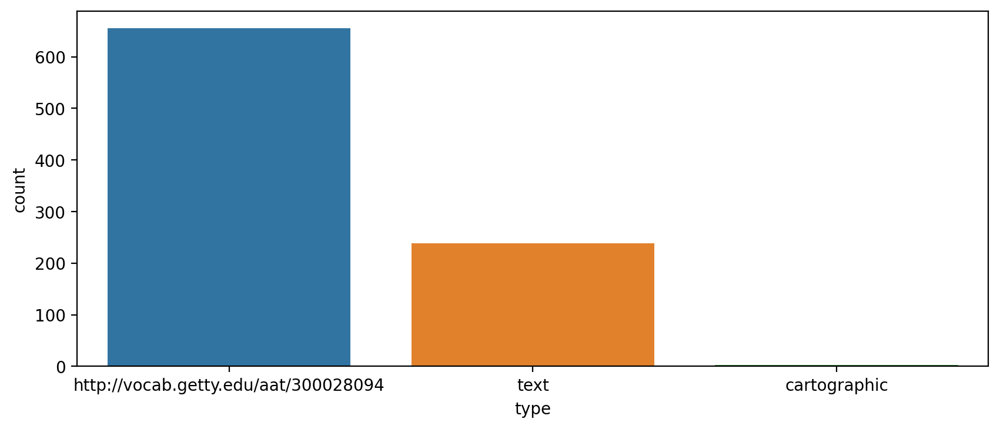

In [37]:
plt.figure(figsize=(10,4),dpi=200)
sns.countplot(x='type',data=alma_beeldbank)

In [24]:
print('10 most occuring formats in beelbank data: \n', alma_beeldbank['format'].value_counts().iloc[:10].to_latex())

10 most occuring formats in beelbank data: 
 \begin{tabular}{lr}
\toprule
{} &  format \\
\midrule
vorm                         &     932 \\
handgemaakt: aquarel         &     838 \\
op de schijf gedraaid        &     399 \\
aardewerkmateriaal           &     300 \\
sculptuur, afgietsel in gips &     241 \\
offset                       &     209 \\
geschilderd                  &     205 \\
gedrukt: lithografie         &     167 \\
vlakdruk                     &     141 \\
sculptuur                    &     135 \\
\bottomrule
\end{tabular}



/tmp/ipykernel_534/1964424418.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print('10 most occuring formats in beelbank data: \n', alma_beeldbank['format'].value_counts().iloc[:10].to_latex())


In [26]:
print('unique entries in language category:\n', alma_beeldbank['language'].unique())

unique entries in language category:
 ['fre' 'dut' 'yid' 'heb' 'lat' 'arm' 'arc' 'spa' 'ita' 'ger' 'por' 'eng'
 'goh' 'nds' 'und' 'grc' 'mul' 'ara' 'fry' 'mis' 'swe' 'afr' 'may' 'san'
 'chi' 'nor' 'rus' 'dan' 'map' 'jav' 'sun' 'dum' 'epo' 'gre' 'ben' 'hun'
 'paa' 'fin' 'pol' 'ban' 'per' 'Nederlands [TA].' 'hin' 'ind' 'egy' 'xxx'
 'Text in Latin and Dutch.' 'Hebreeuws in Latijns schrift.'
 'Duits met Hebreeuwse letters.' 'In het Duits met Hebreeuwse letters.'
 'Duits met Hebreeuwse.' 'Tekst in het Duits met Hebreeuwse letters.'
 'Taal onduidelijk, vermoedelijk Duits.'
 'Taal: misschien Hebreeuws in transcriptie.'
 'Taal onduidelijk, vermoedelijk Hebreeuws in transcriptie.']


In [36]:
print('value counts in language category per language:\n', alma_beeldbank['language'].value_counts().iloc[:10].to_latex())

value counts in language category per language:
 \begin{tabular}{lr}
\toprule
{} &  language \\
\midrule
dut &     13204 \\
heb &      9762 \\
xxx &      5737 \\
ger &       976 \\
fre &       657 \\
lat &       618 \\
eng &       567 \\
und &       181 \\
yid &       151 \\
spa &        70 \\
\bottomrule
\end{tabular}



/tmp/ipykernel_534/1641250430.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print('value counts in language category per language:\n', alma_beeldbank['language'].value_counts().iloc[:10].to_latex())


In [41]:
print('unique authors of items in beeldbank:\n', alma_beeldbank['contributor'].unique())

unique authors of items in beeldbank:
 ['Quellinus, Artus (Artus), beeldhouwer, 1609-1668. (NL-LeOCL)091438969 https://open-na.hosted.exlibrisgroup.com/alma/31UKB_UAM1_INST/authorities/9839288655305131.jsonld'
 'Lennep, J. van (Jacob), 1802-1868, publisher (NL-LeOCL)06833544X https://open-na.hosted.exlibrisgroup.com/alma/31UKB_UAM1_INST/authorities/9839182012305131.jsonld'
 'Zevi Hirsh ben Abraham transcriber' ...
 'Mascarenhas, Pero (NL-LeOCL)144244322 https://open-na.hosted.exlibrisgroup.com/alma/31UKB_UAM1_INST/authorities/9839331252005131.jsonld'
 'Sampayo, Lopo Vaz de, 1526 fl. (NL-LeOCL)144243121 https://open-na.hosted.exlibrisgroup.com/alma/31UKB_UAM1_INST/authorities/9839331253705131.jsonld'
 'Śaśporṭaś, Yaʿaqov (Jacob), 1610-1698. (NL-LeOCL)109311817 https://open-na.hosted.exlibrisgroup.com/alma/31UKB_UAM1_INST/authorities/9839298098705131.jsonld']


In [42]:
print('n0 of occuring items per author:\n', alma_beeldbank['contributor'].value_counts())

n0 of occuring items per author:
 Pekidim & Amarkalim (Amsterdam) rcp                                                                                                                                 10044
H. G. Bom Amsterdam                                                                                                                                                   270
G. Th. Bom & Zn Amsterdam                                                                                                                                             156
J. L. Beijers Utrecht                                                                                                                                                 156
R. W. P. de Vries Amsterdam                                                                                                                                           126
                                                                                                                    

In [43]:
unique_dates = alma_beeldbank['date'].unique()

In [44]:
print('items per year: ', alma_beeldbank['date'].value_counts().to_markdown())

items per year:  |                                                      |   date |
|:-----------------------------------------------------|-------:|
| 1889                                                 |   1548 |
| 1887                                                 |   1518 |
| 1888                                                 |   1282 |
| 1918                                                 |   1066 |
| 1917                                                 |   1052 |
| 1916                                                 |   1050 |
| 1915                                                 |   1049 |
| 1919                                                 |   1032 |
| 1910                                                 |    916 |
| 1914                                                 |    885 |
| 1883                                                 |    860 |
| 1899                                                 |    830 |
| 1900                                                 |   

In [27]:
alma_beeldbank = alma_beeldbank.dropna(subset=['date'])

In [28]:
alma_beeldbank = alma_beeldbank[alma_beeldbank['date'].str.isnumeric()]

In [29]:
alma_beeldbank['date'] = alma_beeldbank['date'].astype(int)

In [30]:
alma_beeldbank = alma_beeldbank[alma_beeldbank['date'] <= 2022]

In [31]:
alma_beeldbank = alma_beeldbank.sort_values('date')

In [32]:
alma_beeldbank['date'].value_counts(sort=False)

1       16
20       5
30       2
34       1
41       1
        ..
2002     1
2004     3
2005     5
2006     2
2007    13
Name: date, Length: 498, dtype: int64

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

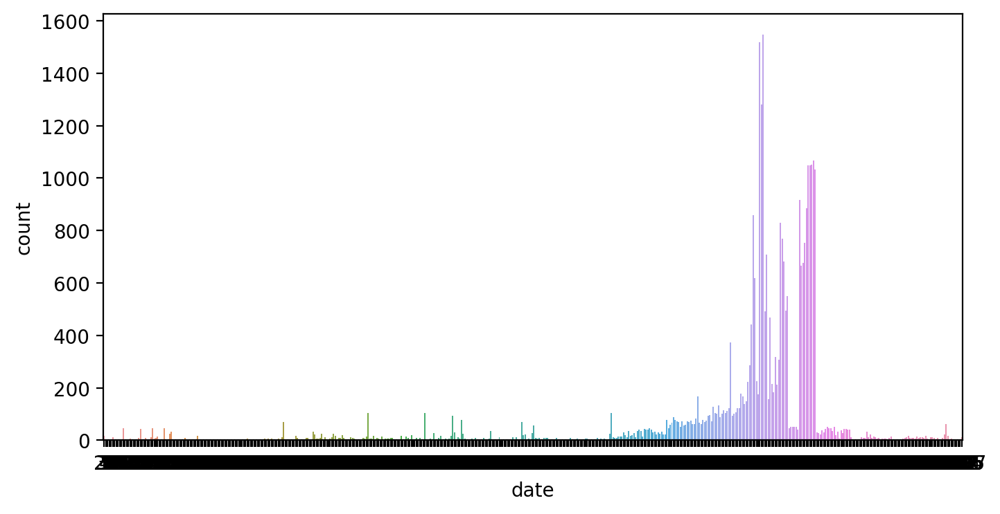

In [33]:
plt.figure(figsize=(8,4),dpi=200)
sns.countplot(x='date', data=alma_beeldbank)
plt.xticks(size=10)


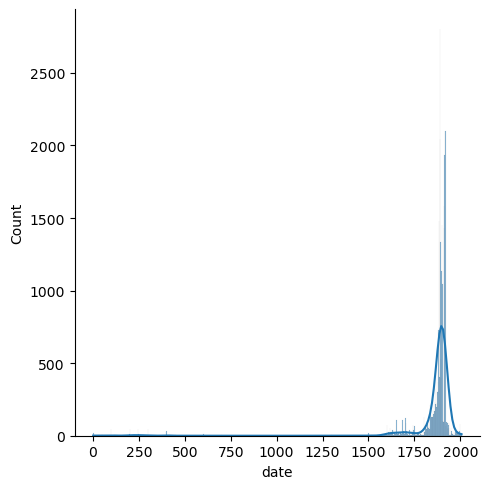

In [34]:
sns.displot(data=alma_beeldbank, x='date', kde=True)

In [28]:
elems_per_year = [len(alma_beeldbank[alma_beeldbank['date'] == years[y]]) for y in range(len(years))]

low = [e for e in elems_per_year if e < 400]
mid = [e for e in elems_per_year if e > 400 and e < 800]
high = [e for e in elems_per_year if e > 800]


In [29]:
#stats
len(years), len(low), len(mid), len(high)

(521, 496, 13, 12)

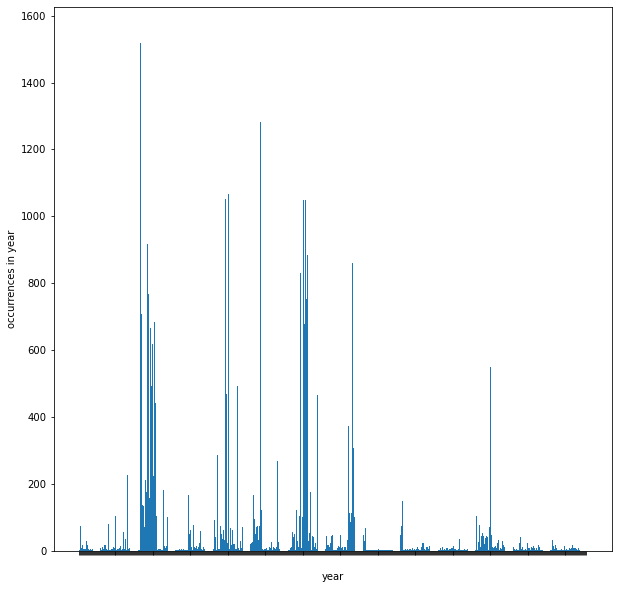

In [30]:
plt.figure(figsize=(10,10))
plt.bar(years, elems_per_year)
plt.xticks(color='w')
plt.xlabel('year')
plt.ylabel('occurrences in year')
plt.show()

In [8]:
joined = " ".join(alma_beeldbank['title'].dropna().unique())

In [12]:
import wordcloud

In [14]:
# code copied from: https://jingwen-z.github.io/data-viz-with-matplotlib-series9-word-cloud/
wordcloud = wordcloud.WordCloud(width=1280, height=853, margin=0,
                      colormap='Blues').generate(joined)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.margins(x=0, y=0)
plt.savefig('descriptions_wordcloud.png')
plt.show()

AttributeError: 'WordCloud' object has no attribute 'WordCloud'

In [ ]:
# author to keywords (from titles)
french = set(stopwords.words('french'))
english = set(stopwords.words('english'))
german = set(stopwords.words('german'))
dutch = set(stopwords.words('dutch'))

punctuation = set(list(punctuation))

keywords = {}

for author in alma_beeldbank['contributor'].unique():

    body = " ".join(alma_beeldbank[alma_beeldbank['contributor'] == author]['title']).lower()
    values = word_tokenize(body)

    lang = alma_beeldbank[alma_beeldbank['contributor'] == author]['language']
    print(lang)

    if author in keywords: 
        print('entry already present!')
        keywords[author][0] += values 
    else:
        keywords[author] = (values, lang)

    keywords[author] = (set(keywords[author][0]), keywords[author][1])
    filtered = []

    for w in keywords[author][0]:

        if keywords[author][1] == 'fre':
            if w not in french:
                if w not in punctuation:
                    filtered.append(w)
        elif keywords[author][1] == 'eng':
            if w not in english:
                if w not in punctuation:
                    filtered.append(w)
        elif keywords[author][1] == 'ger':
            if w not in german:
                if w not in punctuation:
                    filtered.append(w)
        elif keywords[author][1] == 'dut':
            if w not in dutch:
                if w not in punctuation:
                    filtered.append(w)
        else:
            if w not in punctuation:
                filtered.append(w)

    # potentially add language 
    keywords[author] = filtered

0    fre
Name: language, dtype: object


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [ ]:
keywords

{'Quellinus, Artus (Artus), beeldhouwer, 1609-1668. (NL-LeOCL)091438969 https://open-na.hosted.exlibrisgroup.com/alma/31UKB_UAM1_INST/authorities/9839288655305131.jsonld': {',',
  '109',
  'Architecture',
  "d'Amsterdam",
  'de',
  'en',
  'et',
  'figures',
  'la',
  'maison',
  'peinture',
  'représentée',
  'sculpture',
  'taille-douce',
  'ville'}}

## search for APM in any of the columns of alma beeldbank export

In [37]:
substring = 'apm'
df[df.apply(lambda row: row.astype(str).str.contains(substring, case=False).any(), axis=1)]

,Chapter,Paragraph,pages,words,Author(s),stavaza,EN def naar vg,NL vertaling,Image No.,Image name,...,Unnamed: 14,Language,received,naar vertaler NL-EN,Author(s).1,captions,bio,titles,events,APM
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1.3,Koptisch textiel Ankh-Chi Ro APM16324,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[APM16324]
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1.4,Relief APM,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1.9a en b,3 beelden in toga,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.1.7,De bello Gallico APM foto laten maken,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
28,NaN,traveller 5 Abbu Abbas klaar,NaN,NaN,Robin Oomkes,"EN is def, bijschriften ook. NL nog eindredact...",naar vg 20-4,NaN,Trav5.1,stempel met olifant APM7855,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[APM7855]
62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.4.4,Sassanid plates APM9278,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[APM9278]
63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.4.5,Textiel leeuwenjacht APM16772,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[APM16772]
78,NaN,1.6 Late Antique Egypt (300-1000 AD) KLAAR,10,2500,"dr. Tineke Rooijakkers, VU University Amsterdam","naar CV voor def maken, def EN klaar op 31-3, ...",beeld naar WBOOKS 12-6,NaN,1.6.1,beeldje orante APM7468,...,NaN,NL,NaN,NaN,"dr. Tineke Rooijakkers, VU University Amsterdam",NaN,naar CV,naar CV,naar CV,[APM7468]
79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.6.2,MenasflaskAPM 12995,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[APM 12995]
80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.6.3,"Koptisch weefsel, APM16323",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[APM16323]


## Beeldbank marc

In [14]:
titles = [record.title() for record in alma_beeldbank_marc]

In [19]:
# vergelijking van marc en dublin core record. 
# een aantal velden missen/maar waren hoogstwaarschijnlijk niet nuttig geacht. 

example_record = alma_beeldbank_marc[0]
print(example_record)

print('comparison with \n')

for name, values in alma_beeldbank.loc[0].iteritems():
    print(values)

=LDR  02118nam a2200421Mi 4500
=005  20211110112845.0
=006  m|||||o||d||||||||
=007  cr||||||||||||
=008  190430|1719\\\\ne\||||\o\\\\||||\||fre|d
=001  990037822970205131
=024  7\$ahttps://hdl.handle.net/11245/3.3680$2hdl
=026  \\$c171902$ab1 A2 lem : b2 F F$2stcnf
=040  \\$aQGK$bdut
=041  0\$afre
=044  \\$ane
=100  1\$aCampen, Jacob van,$carchitect/bouwmeester,$d1595-1657.$0http://data.bibliotheken.nl/id/thes/p069356742
=245  10$aArchitecture, peinture et sculpture de la maison de ville d'Amsterdam, représentée en CIX figures en taille-douce ...
=246  3\$aArchitecture, peinture et sculpture de la maison de ville d'Amsterdam, représentée en 109 figures en taille-douce
=260  \\$aA Amsterdam,$bchez Gerard Valk$c1719
=300  \\$a1 online resource (22 p., 109 bl)$btitelvignet, portr., grav
=336  \\$atekst$btxt$2rdacontent/dut
=337  \\$acomputer$bc$2rdamedia/dut
=338  \\$aonline bron$bcr$2rdacarrier/dut
=500  \\$aTitelblad in rood en zwart
=500  \\$aOorspronkelijk impressum overgeplakt met s

## Data exploration of [archaeological objects](https://uba.uva.nl/en/support/open-data/data-sets-and-publication-channels/data-sets-and-publication-channels.html#Archeological-objects)
dublin core, [download](https://diensten.uba.uva.nl/open_data/downloads/uva_alma_archobjects_dc_new.tar.gz)

In [37]:
# dc export
archobjects_dc = pd.read_xml('data/uva_alma_archobjects_dc_new.xml')
archobjects_dc

,schemaLocation,title,description,publisher,date,type,format,identifier,language,relation,subject,contributor
0,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Amfoor aardewerk; vaatwerk,None,None,900-600 voor Christus IJzertijd II,NaN,op wiel gedraaid,https://pid.uba.uva.nl/ark:/88238/b19900378131...,xxx,None,None,None
1,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,vrouwenkop gips; menselijke figuur,None,None,1860,NaN,gegoten,https://pid.uba.uva.nl/ark:/88238/b19900377732...,xxx,None,None,None
2,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,vrouwenkop gips; menselijke figuur,None,None,1860,NaN,gegoten,https://pid.uba.uva.nl/ark:/88238/b19900377732...,xxx,None,None,None
3,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,hangertje glas: sieraad,None,None,200 n. Chr.,NaN,gegoten,https://pid.uba.uva.nl/ark:/88238/b19900377732...,xxx,None,None,None
4,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,hangertje glas: sieraad,None,None,200 n. Chr.,NaN,gegoten,https://pid.uba.uva.nl/ark:/88238/b19900377732...,xxx,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...
18268,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,fragmenten kom vaas tegel aardewerk: architect...,Architectural Terracottas in the Allard Pierso...,None,keizertijd,NaN,aardewerkmateriaal,https://pid.uba.uva.nl/ark:/88238/b19900325330...,xxx,None,None,None
18269,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,baksteen aardewerk: architecturaal,Architectural Terracottas in the Allard Pierso...,None,keizertijd,NaN,vorm incisie,https://pid.uba.uva.nl/ark:/88238/b19900325330...,xxx,None,None,None
18270,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,legioenbaksteen aardewerk: architecturaal,Architectural Terracottas in the Allard Pierso...,None,keizertijd,NaN,vorm,https://pid.uba.uva.nl/ark:/88238/b19900325329...,xxx,None,None,None
18271,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,lansmodel organisch: wapen,None,None,1800,NaN,houtmateriaal,https://pid.uba.uva.nl/ark:/88238/b19900325329...,xxx,None,None,None


marc extension, [download](https://diensten.uba.uva.nl/open_data/downloads/uva_alma_archobjects_marc_new.tar.gz) first edited from xml to marc using [marc editing tool](https://marcedit.reeset.net/downloads). 

In [ ]:
from pymarc import MARCReader

with open('data/uva_alma_archobjects_marc_new.mrc', 'rb') as fh:
    reader = MARCReader(fh)
    for record in reader:
        print(record)

=LDR  00656nrm a2200217   4500
=005  20220817130125.0
=008  190411b\\\\\\\\xx\||||\|\\\\||||\||xxx|d
=001  990037813110205131
=046  \\$ai$b900$d600
=245  00$aAmfoor$kaardewerk; vaatwerk
=260  \\$g900-600 voor Christus, IJzertijd II
=300  \\$ch 450 (mm)
=340  \\$aaardewerk$3materiaal
=340  \\$dop wiel gedraaid
=520  2\$aGrote amfoor.
=583  0\$lcompleet
=694  \\$aaardewerk; vaatwerk
=694  \\$dAziatisch$eIsraelitisch$fIsrael
=971  \\$aIsrael$ecreator
=852  8\$bAPM$hAPM17560$822243652710005131
=024  7\$ahttps://pid.uba.uva.nl/ark:/88238/b1990037813110205131$2ark

=LDR  00891nrm a2200253   4500
=005  20220817130157.0
=008  160928|18601870xx\||||\|\\\\||||\||xxx|d
=001  990037773230205131
=046  \\$ai
=245  \0$avrouwenkop$kgips; menselijke figuur
=260  \\$g1860-1870 na Christus
=300  \\$ch 550 (mm)
=340  \\$agips$3materiaal
=340  \\$dgegoten
=520  2\$aGipsen kop van vrouw met rond hoofd gebonden vlecht. Model voor de gevelsculptuur van het gebouw van de Nederlandsche Bank, thans Allard Pierso

In [ ]:
from pymarc import parse_xml_to_array

records = parse_xml_to_array('data/uva_alma_archobjects_marc_new.xml')
records

 ...]

## theater dataset

In [11]:
tin = pd.read_xml('data/wwwopac_TIN_limit100000.xml')
tin

,record,hits,xmltype,hits_on_display,search,first_item,forward,backward,limit,dbname,dsname,cgistring,link_resolve_time,xml_creation_time,response_time
0,NaN,NaN,None,NaN,None,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN
1,NaN,329.0,Grouped,329.0,pointer 108,1.0,0.0,0.0,100000.0,collect,intern,NaN,8854.3961,15.0,9152.0


In [5]:
tin_1 = pd.read_xml('data/theatercollecties_test1.xml')
tin_1

,creator,creator.role,New_collect_field,performance.production_code,performance.title,performance.title.lref,production.date,reproduction.identifier_URL,reproduction.reference,institution.name,object_category,object_name,object_number,priref,production.date.start,title
0,"Roelofs, Charles",None,None,NaN,None,NaN,None,None,None,None,None,None,None,NaN,NaN,None
1,"Moritz, Ernst",None,None,NaN,None,NaN,None,None,None,None,None,None,None,NaN,NaN,None
2,None,ontwerp,None,NaN,None,NaN,None,None,None,None,None,None,None,NaN,NaN,None
3,None,fotografie,None,NaN,None,NaN,None,None,None,None,None,None,None,NaN,NaN,None
4,None,None,Gelegenheidscombinaties,1.238905e+08,Aias,21012.0,1939-05-23,None,None,None,None,None,None,NaN,NaN,None
5,None,None,None,NaN,None,NaN,None,qm00217.000.jpg,qm00217.000,None,None,None,None,NaN,NaN,None
6,None,None,None,NaN,None,NaN,None,None,None,Theater Instituut Nederland,None,None,None,NaN,NaN,None
7,None,None,None,NaN,None,NaN,None,None,None,None,maquette,None,None,NaN,NaN,None
8,None,None,None,NaN,None,NaN,None,None,None,None,None,maquette,None,NaN,NaN,None
9,None,None,None,NaN,None,NaN,None,None,None,None,None,None,qm00217.000,NaN,NaN,None


In [3]:
archobjects = pd.read_xml('data/uva_alma_archobjects_dc_new.xml')
archobjects

,schemaLocation,title,description,publisher,date,type,format,identifier,language,relation,subject,contributor
0,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,Amfoor aardewerk; vaatwerk,None,None,900-600 voor Christus IJzertijd II,NaN,op wiel gedraaid,https://pid.uba.uva.nl/ark:/88238/b19900378131...,xxx,None,None,None
1,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,vrouwenkop gips; menselijke figuur,None,None,1860,NaN,gegoten,https://pid.uba.uva.nl/ark:/88238/b19900377732...,xxx,None,None,None
2,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,vrouwenkop gips; menselijke figuur,None,None,1860,NaN,gegoten,https://pid.uba.uva.nl/ark:/88238/b19900377732...,xxx,None,None,None
3,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,hangertje glas: sieraad,None,None,200 n. Chr.,NaN,gegoten,https://pid.uba.uva.nl/ark:/88238/b19900377732...,xxx,None,None,None
4,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,hangertje glas: sieraad,None,None,200 n. Chr.,NaN,gegoten,https://pid.uba.uva.nl/ark:/88238/b19900377732...,xxx,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...
18268,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,fragmenten kom vaas tegel aardewerk: architect...,Architectural Terracottas in the Allard Pierso...,None,keizertijd,NaN,aardewerkmateriaal,https://pid.uba.uva.nl/ark:/88238/b19900325330...,xxx,None,None,None
18269,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,baksteen aardewerk: architecturaal,Architectural Terracottas in the Allard Pierso...,None,keizertijd,NaN,vorm incisie,https://pid.uba.uva.nl/ark:/88238/b19900325330...,xxx,None,None,None
18270,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,legioenbaksteen aardewerk: architecturaal,Architectural Terracottas in the Allard Pierso...,None,keizertijd,NaN,vorm,https://pid.uba.uva.nl/ark:/88238/b19900325329...,xxx,None,None,None
18271,http://www.openarchives.org/OAI/2.0/oai_dc/ ht...,lansmodel organisch: wapen,None,None,1800,NaN,houtmateriaal,https://pid.uba.uva.nl/ark:/88238/b19900325329...,xxx,None,None,None


In [15]:
tin_1 = pd.read_xml('data/theatercollecties_test1.xml')

values = [tin_1[c].iloc[tin_1[c].first_valid_index()] for c in tin_1.columns]

# expects list of tuples: [('column name', 'column_value'), ..., ]
def to_lod(input_field):
    if input_field[0] == 'creator':
        return ('http://purl.org/dc/elements/1.1/creator', input_field[1])
    if input_field[0] == 'creator.role':
        return ('http://purl.org/dc/elements/1.1/creator', input_field[1])
    if input_field[0] == 'performance.title':
        return ('https://www.dublincore.org/specifications/dublin-core/dcmi-terms/elements11/title/', input_field[1])
    if input_field[0] == 'production.date':
        return ('http://purl.org/dc/elements/1.1/date', input_field[1])
    if input_field[0] == 'reproduction.reference':
        return ('http://purl.org/dc/elements/1.1/identifier', input_field[1])
    if input_field[0] == 'object_category':
        return ('https://www.dublincore.org/specifications/dublin-core/dcmi-terms/elements11/type/', input_field[1])
    else: 
        return input_field

result = map(to_lod, list(zip(tin_1.columns, values)))
lod_result = pd.DataFrame(result, columns= ['predicate', 'object'])
lod_result


,predicate,object
0,http://purl.org/dc/elements/1.1/creator,"Roelofs, Charles"
1,http://purl.org/dc/elements/1.1/creator,ontwerp
2,New_collect_field,Gelegenheidscombinaties
3,performance.production_code,123890453.001
4,https://www.dublincore.org/specifications/dubl...,Aias
5,performance.title.lref,21012.0
6,http://purl.org/dc/elements/1.1/date,1939-05-23
7,reproduction.identifier_URL,qm00217.000.jpg
8,http://purl.org/dc/elements/1.1/identifier,qm00217.000
9,institution.name,Theater Instituut Nederland


In [12]:
import requests

URL = "https://servicetin.adlibhosting.com/te4/wwwopac.ashx?command=search&database=collectTEphotos3&search=pointer%20353&output=xml&limit=10&startfrom=1&xmltype=grouped"

response = requests.get(URL)
with open('feed.xml', 'wb') as file:
    file.write(response.content)

In [15]:
tin_1 = pd.read_xml('feed.xml')
tin_1

,record,hits,xmltype,hits_on_display,search,first_item,forward,backward,limit,dbname,dsname,cgistring,link_resolve_time
0,NaN,NaN,None,NaN,None,NaN,NaN,NaN,NaN,None,None,NaN,NaN
1,NaN,759.0,Grouped,10.0,pointer 353,1.0,0.0,0.0,10.0,collect,intern,NaN,93.7474


## export images from alma beeldbank

In [ ]:
import requests
from bs4 import BeautifulSoup

# Making a GET request
r = requests.get('https://www.theatercollectie.uva.nl/Details/collect/42164')

# Parsing the HTML
soup = BeautifulSoup(r.content, 'html.parser')
print(soup.prettify())

In [ ]:
s = soup.find('div', class_='record')

labels = s.find('div', class_='label')
values = s.find('div', class_='value')
s

In [3]:
from PIL import Image
import requests
import bs4

In [43]:
alma_beeldbank['identifier']

# for handl in alma_beeldbank['identifier']:
#     print(handl)

# url = 'some.site.com'

# response = requests.get(url)

# soup = bs4.BeautifulSoup(response.text, 'html.parser')

# image = soup.find('img')
# image_url = image['src']


# img = Image.open(requests.get(image_url, stream = True).raw)

# img.save('image.jpg')

0                      https://hdl.handle.net/11245/3.3680
1                      https://hdl.handle.net/11245/3.3641
2                      https://hdl.handle.net/11245/3.3708
3                      https://hdl.handle.net/11245/3.3709
4        https://pid.uba.uva.nl/ark:/88238/b19900378229...
                               ...                        
35559                    https://hdl.handle.net/11245/3.94
35560                  https://hdl.handle.net/11245/3.2533
35561                   https://hdl.handle.net/11245/3.708
35562                  https://hdl.handle.net/11245/3.2525
35563                   https://hdl.handle.net/11245/3.205
Name: identifier, Length: 35564, dtype: object

# linking from online --> offline

In [6]:
literature = []

def literature(link):
    page = requests.get(link)
    soup = BeautifulSoup(page.content, "html.parser")

    lit = []

    litsec = soup.find_all(class_="row label-publications")

    for l in litsec:
        lit += [l.find_all(class_='object-detail-data')[0].text]
    return lit

l = alma_beeldbank['identifier'].iloc[:50].apply(literature)

In [7]:
alma_beeldbank['literature'] = l

In [10]:
alma_beeldbank['literature']
alma_beeldbank['literature'].iloc[8]

['Bibliotheca gastronomica 4112']

In [12]:
query = ['Bibliotheca']
df_x = alma_beeldbank.explode('literature')
df_x.set_index('literature').loc[query].reset_index(drop=True)

KeyError: "None of [Index(['Bibliotheca'], dtype='object', name='literature')] are in the [index]"

In [7]:
alma_beeldbank['literature'] = literature

0         []
1         []
2         []
3         []
4         []
        ... 
35559    NaN
35560    NaN
35561    NaN
35562    NaN
35563    NaN
Name: literature, Length: 35564, dtype: object

# ground truth APM labels

In [3]:
import math

In [4]:
df = pd.read_excel('../data/catalogs/Crossroads - spreadsheet.xlsx', header=9)

In [5]:
import re

def apm(descr):
    return re.findall('(?:APM)\s*\d+', descr)

df['APM'] = df['Image name'].dropna().apply(apm)

In [6]:
df['APM']

0             NaN
1             NaN
2              []
3              []
4              []
          ...    
249           NaN
250           NaN
251           NaN
252    [APM 7808]
253            []
Name: APM, Length: 254, dtype: object

In [7]:
references = df['APM'].values.tolist()

In [8]:
references = [r for r in references if r != [] and type(r) != float]

In [9]:
references
online_indices = [(0,0),(3,0),(5,0),(6,0),(9,1)]

In [10]:
references

[['APM16324'],
 ['APM7855'],
 ['APM9278'],
 ['APM16772'],
 ['APM7468'],
 ['APM 12995'],
 ['APM16323'],
 ['APM7798'],
 ['APM3830'],
 ['APM 14036'],
 ['APM 8471'],
 ['APM7071'],
 ['APM16369'],
 ['APM 7808']]

actually we have to cross reference this against the APM numbers in the pdf of the catalog

In [11]:
# from catalog

In [12]:
illustratieverantwoording = ' 10 above (APM16324),  \n1 3 (APM13822, APM9370),  \n29 above (APM7855),  5 1 (APM9276, APM9278, APM9280),  52 (APM16772),  \n66 (APM7468),  \n6 7 (APM12995),  \n69, 71 (APM7798),  \n72 (APM16388),  73 (APM3830),  \n7 4 (APM7798),  \n103 below (APM12974), \n1 46 (APM8471),  1 47 (APM8107),  \n1 6 2 (APM7071),  1 63 left (APM09163),  \n1 63 right (APM15589),  \n1 7 6 above (APM16369), 1 80 (APM3831, APM10998)'

In [13]:
references_book = apm(str(illustratieverantwoording))

In [14]:
def cross_reference(references, references_book):
    
    cr = []
    
    for r in references_book:
        if [r] in references:
            cr += [r]
    return cr

In [15]:
references, references_book

([['APM16324'],
  ['APM7855'],
  ['APM9278'],
  ['APM16772'],
  ['APM7468'],
  ['APM 12995'],
  ['APM16323'],
  ['APM7798'],
  ['APM3830'],
  ['APM 14036'],
  ['APM 8471'],
  ['APM7071'],
  ['APM16369'],
  ['APM 7808']],
 ['APM16324',
  'APM13822',
  'APM9370',
  'APM7855',
  'APM9276',
  'APM9278',
  'APM9280',
  'APM16772',
  'APM7468',
  'APM12995',
  'APM7798',
  'APM16388',
  'APM3830',
  'APM7798',
  'APM12974',
  'APM8471',
  'APM8107',
  'APM7071',
  'APM09163',
  'APM15589',
  'APM16369',
  'APM3831',
  'APM10998'])

In [16]:
# all of the 

In [17]:
cross_reference(references, references_book)

['APM16324',
 'APM7855',
 'APM9278',
 'APM16772',
 'APM7468',
 'APM7798',
 'APM3830',
 'APM7798',
 'APM7071',
 'APM16369']

In [18]:
"Inventory numbers Allard
Pierson Museum
Cover: 14232
p. 6: 16751
p. 28: 3493
p. 31: 3271
p. 33: 7802
p. 35: above 7164, below 7316
p. 37: 7971
p. 38: 9227
p. 40: 16883
p. 41: 16228
p. 43: 13055
p. 45: 1379
p. 48: 13937
p. 50: above 12378, below
10167
p. 52: 13825
p. 53: 1627
p. 55: 7347 and 7349
p. 56: 7286
p. 57: 7359 and 13963
p. 59: 7326
p. 61: 2907
p. 62: 1786 (photo Restauratieatelier
Restaura)
p. 64: above 3239 and 2845,
below 1785
p. 65: 788
p. 69: 1892
p. 72: 8343
p. 73: above 13946,
below 15758
p. 74: above 15369 and 15370
p. 75: 14005
p. 76: 6349
p. 77: 12428
p. 78: 7592
p. 80: 15396
p. 81: 8188
p. 82: 3242 and 3243
p. 84: above 9374, below 1774
p. 85: 8180
p. 86: 3269
p. 87: 3422
p. 92: 12
p. 93 above 1606
p. 95: 8552
p. 96: 35
p. 97: above 12417, below
12534
p. 100: above 7066, 8124, 8116,
below 8117, 7065, 8120
p. 101: 7974
p. 102: 7757
p. 103: 8133
p. 104: left 7288, 7290, 7874
and 8023, right 725
p. 105: 7768
p. 107: 8146.001-009
p. 108: 8169
p. 109: 16217
p. 110: 16166
p. 115: 9234
p. 118: 1674
p. 119: 15076
p. 122: 1402
p. 123: 8016
p. 124: 7799
p. 126: 8175
p. 128: 7946
p. 131: 11972
p. 132: 1765
p. 133: 15914
p. 137: 5205, 5208, 5216, 5220,
5222, 5230
p. 139: 15927
p. 140: 9894-9900, 10675
p. 141: 9350
p. 142: 8133
p. 143: 7022
p. 144: 6295, 6296, 7304,
7308, 14165
p. 145: 7001, 7003, 7004
p. 146: 724
p. 148: 1687
p. 151: above 15746, below
1722
p. 153: 8363, 319, 1681, 6319,
p. 156: 12.324
p. 157: left 16618, right 12481
p. 158: above 15689,
below 15999
p. 161: 451
p. 162: 3579
p. 163: 7163
p. 164: 7310
p. 165: 9224
p. 167: 7379
p. 174: 14.409
p. 176: 5180
p. 177: 16763
p. 178-179: 10854
p. 180: 10.854
p. 181: 9241
p. 182: 6287
p. 183: 16882
p. 185: 16604, 16607, 16612,
16614, 16616, 16610

SyntaxError: EOL while scanning string literal (1299147726.py, line 1)

In [19]:
Inventarisnummers
Allard Pierson Museum
omslag: 4076
blz. 17: boven 196-1/2; onder
4170-4173, 4222
blz. 18: 4206, 4143, 4145
blz. 21: 15290
blz. 22: boven 4162, 4218, 4164, 4219;
onder 3974/3863, 3972A
blz. 23: 12637
blz. 33: 12720, 15276, 3943
blz. 34: boven 3858; onder 12676,
12678
blz. 35: boven 4044; onder 15999,
16476
blz. 37: 15302, 15301
blz. 39: boven 7298; onder 4306
blz. 40: 3635, 12683
blz. 42: boven 8752/14021; onder
Schriftmuseum Dortmond
P. Amsterdam 22
blz. 43: 9274, 15592
blz. 46: 3933
blz. 47: 8850
blz. 48: 3400
blz. 49: 16000
blz. 51: 8539
blz. 53: 12698
blz. 54: 12647, 14238
blz. 63: 15350
blz. 64: 9237
blz. 65: 8789
blz. 69: 12978
blz. 73: APM 9115
blz. 75: 1387
blz. 76: boven 3408, 360, 3799;
onder 11960
blz. 77: 12718, 8537
blz. 78: 8851; Schriftmuseum
Dortmond, no. 115
blz. 79: boven 9114; onder 8875, 1676
blz. 86: 16500
blz. 87: boven 9223; onder 8811
blz. 88: 13283a-j, 8800
blz. 99: 391
blz. 100: boven 8065; onder 13292
blz. 102: 7774
blz. 103: 12760, 4307, 15326
blz. 104: 12977
blz. 105: 9475, 9492, 9502
blz. 106: 8562, 8563, 8417
blz. 107: 8831
blz. 108: 20
blz. 109: 8837
blz. 111: 13219
blz. 115: 8795/6
blz. 116: 7126
blz. 117: 7772
blz. 118: 6289
blz. 119: 7993
blz. 120: 8846
blz. 124: 7216, 7238, 7272
blz. 125: 13158
blz. 129: 7758
blz. 130: 7763
blz. 131: 9369
blz. 132: 8517
blz. 133: 7796
blz. 135: 14232
blz. 136: 7860, 7861
blz. 137: 9353
blz. 138: 7874, 9227
blz. 139: 7803
blz. 141: 7766
blz. 142: boven 7757; onder 7974
blz. 143: 7761
blz. 144: 8188
blz. 145: 6286
blz. 150: 12995, 14513
blz. 152: boven 16750; onder 14510
blz. 153: 8189
blz. 159: 16385

SyntaxError: invalid syntax (1808091653.py, line 2)